# **Overview**

This Jupyter Notebook details the development of a machine learning model for celebrity face recognition. The project utilizes TensorFlow, Keras, and other Python libraries to process and classify images into distinct celebrity categories. It encompasses data preprocessing, model creation with advanced techniques like ensemble learning, and thorough evaluation of the model's performance. This comprehensive guide is structured to facilitate easy understanding and replication of the processes for educational or development purposes.

# Preprocessing

## Initialize Environment and Import Libraries


Setting the working directory, we import necessary libraries for image handling (OpenCV), data manipulation (NumPy), visualization (Matplotlib), and machine learning (TensorFlow). This prepares our environment with all the tools required for data processing and model building.

In [1]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
ls

drive/  sample_data/


In [3]:
cd drive/MyDrive/AI/ML-Fall2023/project/github

/content/drive/MyDrive/AI/ML-Fall2023/project/github


In [5]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import sys
import random
from sklearn.utils import shuffle
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential, load_model, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout, GlobalAveragePooling2D, Concatenate, Input
from collections import Counter
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from concurrent.futures import ThreadPoolExecutor, wait
from functools import partial
from tensorflow.keras.applications import ResNet50, InceptionV3, MobileNetV2
from tensorflow.keras.preprocessing import image


## Set Up Data Handling and Loading

Define target dimensions for the images and prepare structures to hold the image data and labels. We also establish a mapping between celebrity names and numerical labels to facilitate classification.

In [6]:
target_width, target_height = 224, 224
dataset_folder = 'dataset'
images = []
labels = []
celebrity_folders = [folder for folder in os.listdir(dataset_folder) if os.path.isdir(os.path.join(dataset_folder, folder))]
celebrity_to_label = {celebrity: idx for idx, celebrity in enumerate(celebrity_folders)}
label_to_celebrity = {idx: celebrity for celebrity, idx in celebrity_to_label.items()}

In [7]:
print(celebrity_folders)
print(celebrity_to_label)

['Ali_Daei', 'Alireza_Beiranvand', 'Bahram_Radan', 'Ebi', 'Golshifteh_Farahani', 'Hayedeh', 'Homayoon_Shajarian', 'Javad_Razavian', 'Mehran_Ghafoorian', 'Mehran_Modiri', 'Mohamad_Esfehani', 'Reza_Attaran', 'Sahar_Dolatshahi', 'Seyed_Jalal_Hosseini', 'Taraneh_Alidoosti', 'Googoosh', 'Mohsen_Chavoshi', 'Mahan_Veisi']
{'Ali_Daei': 0, 'Alireza_Beiranvand': 1, 'Bahram_Radan': 2, 'Ebi': 3, 'Golshifteh_Farahani': 4, 'Hayedeh': 5, 'Homayoon_Shajarian': 6, 'Javad_Razavian': 7, 'Mehran_Ghafoorian': 8, 'Mehran_Modiri': 9, 'Mohamad_Esfehani': 10, 'Reza_Attaran': 11, 'Sahar_Dolatshahi': 12, 'Seyed_Jalal_Hosseini': 13, 'Taraneh_Alidoosti': 14, 'Googoosh': 15, 'Mohsen_Chavoshi': 16, 'Mahan_Veisi': 17}


then, we load images from the dataset, resize them to the target dimensions, and associate them with their corresponding labels. As loading this dataset can be time consuming to search each dir, its process is efficiently handled using **multi-threading** to speed up the data loading phase using parallel loading!.

In [8]:
def load_and_resize_image(image_path, target_width, target_height, celebrity_to_label):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (target_width, target_height))
    label = celebrity_to_label[os.path.basename(os.path.dirname(image_path))]
    return image, label

num_threads = 8
with ThreadPoolExecutor(max_workers=num_threads) as executor:
    load_resize_partial = partial(load_and_resize_image, target_width=target_width, target_height=target_height, celebrity_to_label=celebrity_to_label)
    results = list(executor.map(load_resize_partial, [os.path.join(dataset_folder, celebrity_folder, image_name) for celebrity_folder in celebrity_folders for image_name in os.listdir(os.path.join(dataset_folder, celebrity_folder))]))

images, labels = zip(*results)
images = list(images)
labels = list(labels)


In [9]:
label_to_celebrity

{0: 'Ali_Daei',
 1: 'Alireza_Beiranvand',
 2: 'Bahram_Radan',
 3: 'Ebi',
 4: 'Golshifteh_Farahani',
 5: 'Hayedeh',
 6: 'Homayoon_Shajarian',
 7: 'Javad_Razavian',
 8: 'Mehran_Ghafoorian',
 9: 'Mehran_Modiri',
 10: 'Mohamad_Esfehani',
 11: 'Reza_Attaran',
 12: 'Sahar_Dolatshahi',
 13: 'Seyed_Jalal_Hosseini',
 14: 'Taraneh_Alidoosti',
 15: 'Googoosh',
 16: 'Mohsen_Chavoshi',
 17: 'Mahan_Veisi'}

let's check our data info 🤔

In [11]:
print(len(images))
print(label_to_celebrity[labels[0]])
print(images[0].shape)


1134
Ali_Daei
(224, 224, 3)


## Display Sample Images

To ensure that images are loaded and labeled correctly, display a few sample images. This visual confirmation is helpful for verifying the integrity of the preprocessing steps.

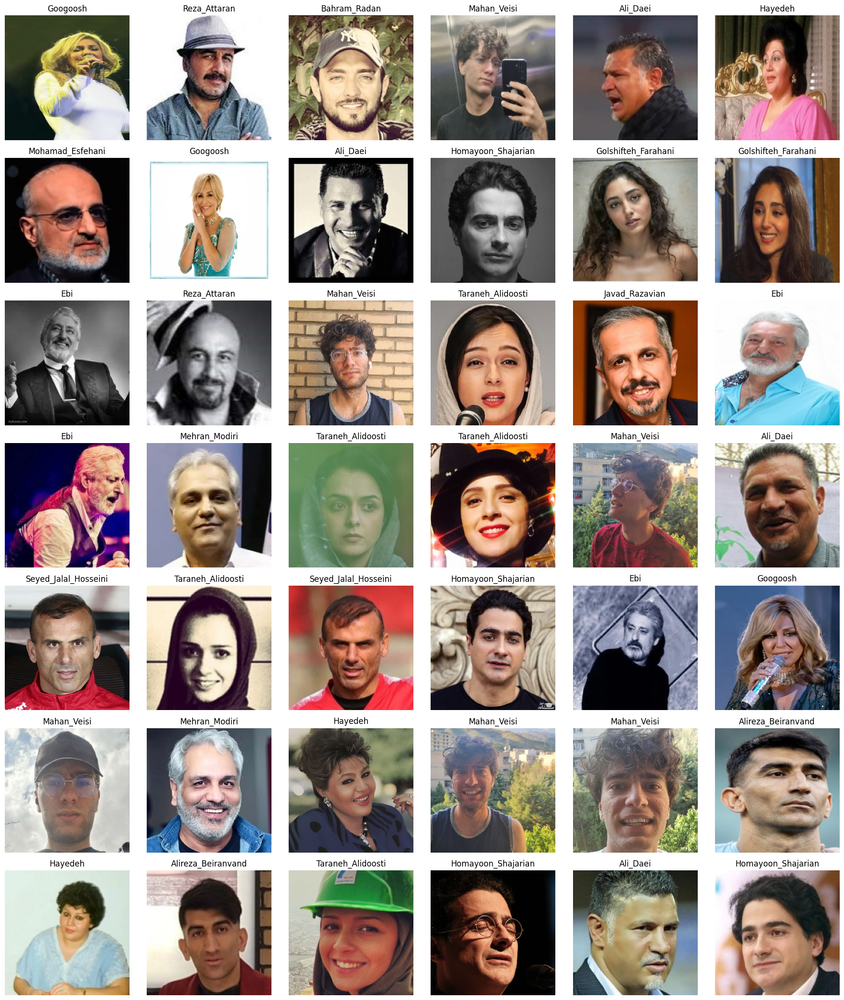

In [30]:
num_images_to_display = 42
rows, cols = 7, 6
display_indices = np.random.choice(len(images), num_images_to_display, replace=False)
fig, axes = plt.subplots(rows, cols, figsize=(18, 21))  # Adjust the figure size

for i, idx in enumerate(display_indices):
    image = images[idx]
    label = labels[idx]
    celebrity_name = label_to_celebrity[label]

    ax = axes[i // cols, i % cols]
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax.set_title(celebrity_name)
    ax.axis('off')

plt.tight_layout()
plt.show()

As you can see, the images are not only focused and **cropped** on the faces but also include various **poses**, adding to the **complexity**. 🙂

The dataset poses a significant challenge due to the variability in the images of each person. For example, some individuals are depicted wearing **glasses** in certain images but not in others. Additionally, variations include the presence or absence of **beards**, different **hairstyles** (long and short), and the use of accessories like **caps** or **hats**.
On the other hand, identifying women wearing **scarves** can be particularly difficult as the scarves obscure some facial identifiers. These variations make the task of identifying individuals more complex. ⚡

## Split Data into Training, Validation, and Test Sets -- Visualize Data Distribution

Divide the dataset into training, validation, and test sets to ensure the model is trained, validated, and tested on distinct data samples. **Stratified** sampling maintains the distribution of classes across these sets.


In [31]:
X_train, X_temp, y_train, y_temp = train_test_split(images, labels, test_size=0.15, random_state=10, stratify=labels)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=10, stratify=y_temp)


then Plot the distribution of class labels in the original dataset and each split to confirm uniformity across training, validation, and test datasets.

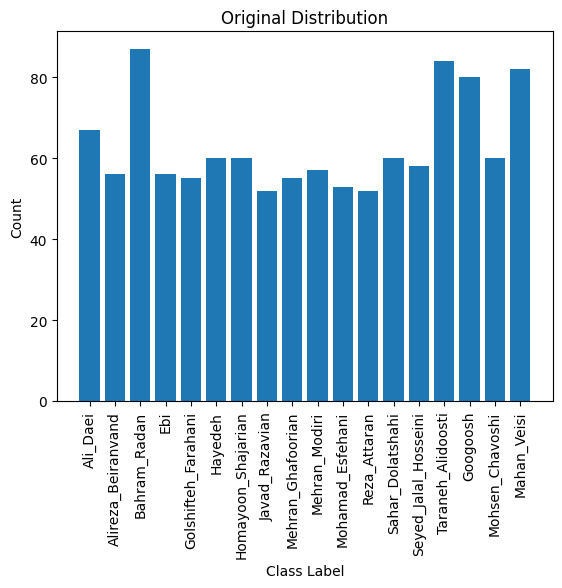

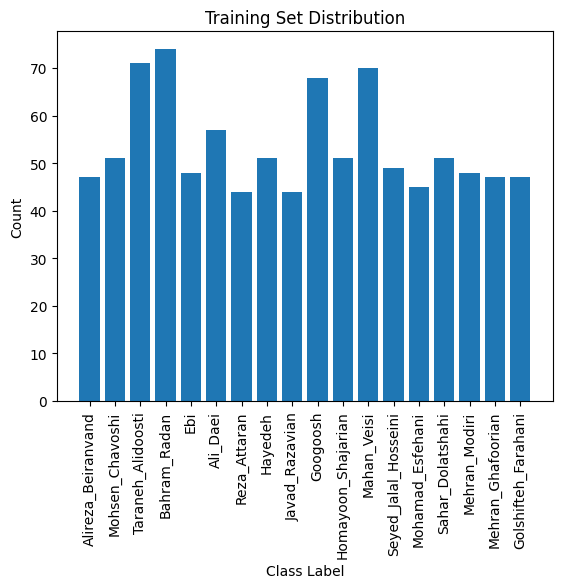

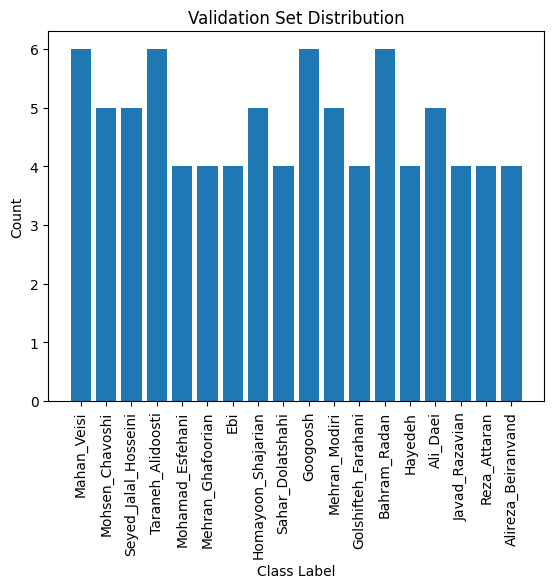

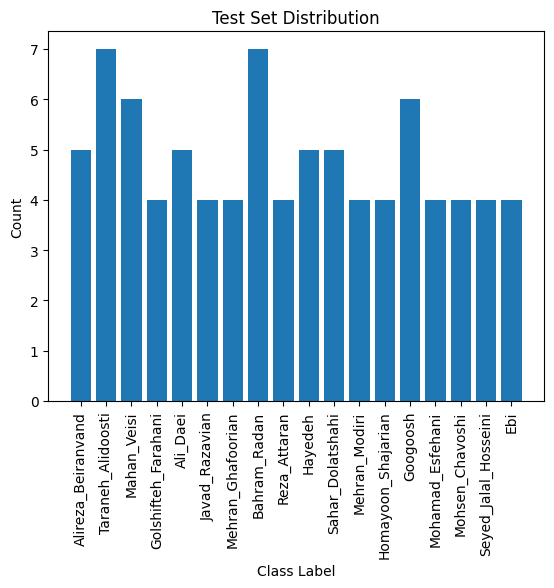

In [33]:
import matplotlib.pyplot as plt
from collections import Counter

# Assuming labels, y_train, y_val, y_test, and label_to_celebrity are already defined

original_distribution = Counter(labels)
training_distribution = Counter(y_train)
validation_distribution = Counter(y_val)
test_distribution = Counter(y_test)

def plot_distribution(class_distribution, title, label_to_celebrity):
    classes, counts = zip(*class_distribution.items())
    class_names = [label_to_celebrity[cls] for cls in classes]
    plt.bar(class_names, counts)
    plt.title(title)
    plt.xlabel('Class Label')
    plt.ylabel('Count')
    plt.xticks(rotation=90)  # Rotate x labels for better readability if they are long
    plt.show()

plot_distribution(original_distribution, 'Original Distribution', label_to_celebrity)
plot_distribution(training_distribution, 'Training Set Distribution', label_to_celebrity)
plot_distribution(validation_distribution, 'Validation Set Distribution', label_to_celebrity)
plot_distribution(test_distribution, 'Test Set Distribution', label_to_celebrity)


## **Data Augmentation and Storage**

This section deals with augmenting the training images to increase the diversity of the dataset, which can help the model generalize better. The augmented images are saved along with the original images in a structured directory format for easy access.


#### Image Augmentation


The `ImageDataGenerator` from Keras is used to perform various augmentations such as rotations, shifts, shearing, flipping, and brightness adjustments. These augmentations help create a more robust model by simulating different scenarios the model might encounter in real-world data.

In [34]:
datagen1 = ImageDataGenerator(
    rotation_range=90,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.30,
    horizontal_flip=True,
    fill_mode='nearest',
    brightness_range=[0.8, 1.2]
)

augmented_dir = 'augmented_dataset_final2'
num_augmentations = 2

def augment_image1(image, color_augmentation=False):
    if color_augmentation:

        image = tf.convert_to_tensor(image, dtype=tf.float32)
        image = tf.image.random_hue(image, 0.1)
        image = tf.image.random_saturation(image, 0.8, 1.2)
        image = tf.image.random_brightness(image, 0.1)
        image = tf.image.random_contrast(image, 0.8, 1.2)

        image = image.numpy()

    image = datagen1.random_transform(image)

    return image

### **Directory Setup for Augmented Images**


The augmented images will be stored in a directory called `augmented_dataset_final2`, where each image will have its own subdirectory labeled with its class and an index.

In [ ]:
os.makedirs(augmented_dir)
for i, original_image in enumerate(X_train):
    subdirectory = os.path.join(augmented_dir, f'img_{y_train[i]}_{i}')
    os.makedirs(subdirectory)
    original_image_filename = os.path.join(subdirectory, f'original.jpg')
    cv2.imwrite(original_image_filename, cv2.cvtColor(original_image, cv2.COLOR_RGB2BGR))

    augmented_image = augment_image1(original_image, color_augmentation=True)
    augmented_filename = os.path.join(subdirectory, f'augmented_{0}.jpg')
    cv2.imwrite(augmented_filename, cv2.cvtColor(augmented_image, cv2.COLOR_RGB2BGR))


### **Display some augmented images among their original version in the `train_set`**

In [ ]:
def display_original_and_augments(image_folder, num_samples=5):
    fig, axes = plt.subplots(num_samples, 2, figsize=(15, 5 * num_samples))  # Adjust figsize as needed

    for i in range(num_samples):
        # Randomly pick a directory
        subfolder = np.random.choice(os.listdir(image_folder))
        subfolder_path = os.path.join(image_folder, subfolder)
        image_files = os.listdir(subfolder_path)

        for j, fname in enumerate(sorted(image_files)):  # Assuming 'original.jpg', 'augmented_0.jpg'
            image_path = os.path.join(subfolder_path, fname)
            image = cv2.imread(image_path)

            ax = axes[i, j]
            ax.imshow(image)
            ax.set_title(f"{subfolder.split('_')[0]} - {'Original' if 'original' in fname else 'Augmented'}")
            ax.axis('off')

    plt.tight_layout()
    plt.show()

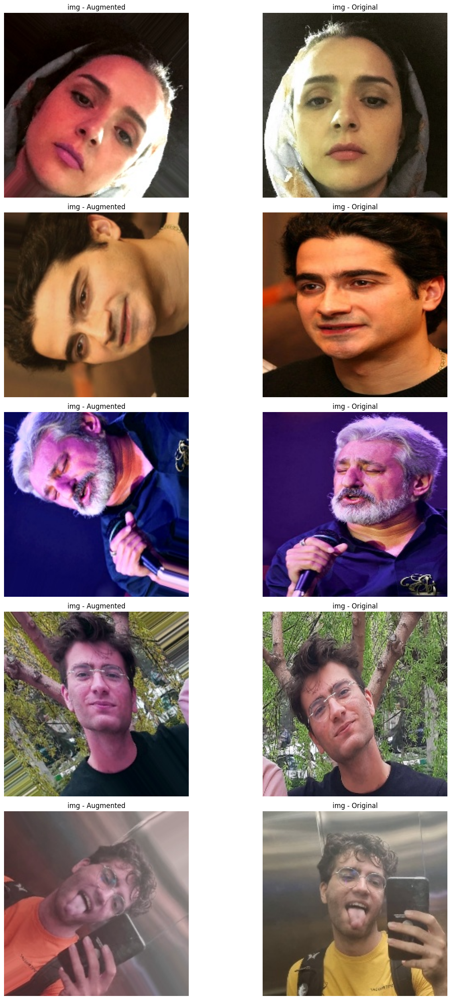

In [63]:
# Call the function with the augmented directory path
display_original_and_augments(augmented_dir, num_samples=5)


### **Load and Process Augmented Images**

After augmenting and saving the images, this section defines functions to load and preprocess them from storage, preparing them for model training. This ensures that all images, both original and augmented, are properly loaded into the training set.

In [ ]:
def load_image(file_path):
    image = cv2.imread(file_path)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

def process_image(celebrity_dir, filename):
    file_path = os.path.join(augmented_dir, celebrity_dir, filename)
    label = int(celebrity_dir.split('_')[1])
    X_train.append(load_image(file_path))
    y_train.append(label)

In [ ]:
X_train = []
y_train = []

for celebrity_dir in os.listdir(augmented_dir):
    with ThreadPoolExecutor() as executor:
        futures = [executor.submit(process_image, celebrity_dir, filename)
                   for filename in os.listdir(os.path.join(augmented_dir, celebrity_dir))]
        wait(futures)

X_train = np.array(X_train)
y_train = np.array(y_train)


Before training, the training data is shuffled to ensure that the training process does not get biased by any order in the data. Additionally, color format transformations are applied to ensure all images are in the RGB format.

In [65]:
X_train, y_train = shuffle(X_train, y_train, random_state=42)
for i in range(len(X_train)):
    # Convert BGR to RGB
    X_train[i] = cv2.cvtColor(X_train[i], cv2.COLOR_BGR2RGB)
for i in range(len(X_val)):
    # Convert BGR to RGB
    X_val[i] = cv2.cvtColor(X_val[i], cv2.COLOR_BGR2RGB)
for i in range(len(X_test)):
    # Convert BGR to RGB
    X_test[i] = cv2.cvtColor(X_test[i], cv2.COLOR_BGR2RGB)

## **Display Sample Images from Each Set**

Visual confirmation of the data in training, validation, and test sets is provided by displaying sample images. This step helps in verifying that the images are ready for model input after all transformations.

train:


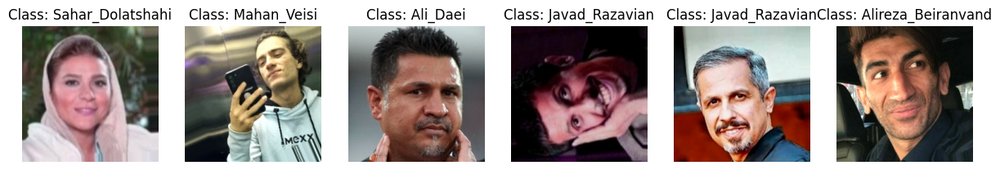

val:


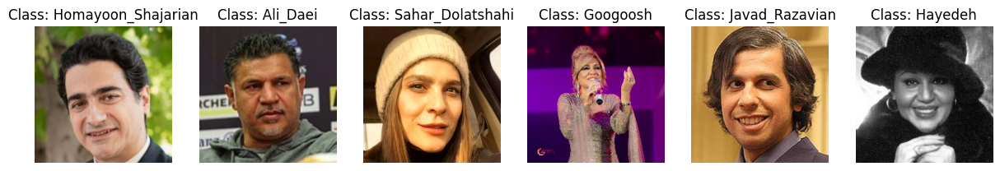

test:


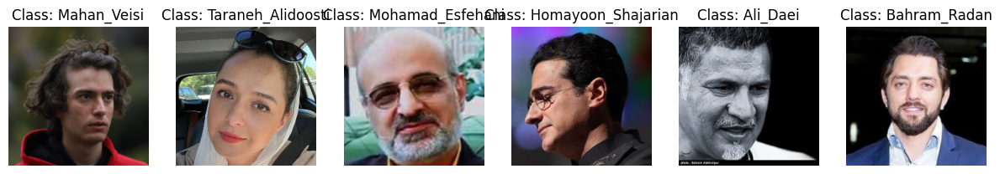

In [76]:
num_samples_to_display = 6
print("train:")
fig, axes = plt.subplots(1, num_samples_to_display, figsize=(15, 3))
for i in range(num_samples_to_display):
    index = np.random.randint(0, len(X_train))
    axes[i].imshow(X_train[index])
    axes[i].set_title(f'Class: {label_to_celebrity[y_train[index]]}')
    axes[i].axis('off')
plt.show()

print("val:")
fig, axes = plt.subplots(1, num_samples_to_display, figsize=(15, 3))
for i in range(num_samples_to_display):
    index = np.random.randint(0, len(X_val))
    axes[i].imshow(X_val[index])
    axes[i].set_title(f'Class: {label_to_celebrity[y_val[index]]}')
    axes[i].axis('off')
plt.show()

print("test:")
fig, axes = plt.subplots(1, num_samples_to_display, figsize=(15, 3))
for i in range(num_samples_to_display):
    index = np.random.randint(0, len(X_test))
    axes[i].imshow(X_test[index])
    axes[i].set_title(f'Class: {label_to_celebrity[y_test[index]]}')
    axes[i].axis('off')
plt.show()

## **Resize and Normalize Images**

Resizing the images to a fixed size ensures that they can be input into the neural network. Normalization (scaling pixel values to [0,1]) helps in faster convergence during training.

In [77]:
target_size = (224, 224)
num_classes = len(label_to_celebrity)

X_train_resized = [tf.image.resize(image, target_size) for image in X_train]
X_train_resized = np.array(X_train_resized)

X_val_resized = [tf.image.resize(image, target_size) for image in X_val]
X_val_resized = np.array(X_val_resized)

X_test_resized = [tf.image.resize(image, target_size) for image in X_test]
X_test_resized = np.array(X_test_resized)

print(X_train_resized.shape)
print(X_train_resized[1].shape)

X_train = X_train_resized / 255.0
X_val = X_val_resized / 255.0
X_test = X_test_resized / 255.0

del X_train_resized
del X_val_resized
del X_test_resized

y_train = to_categorical(y_train, num_classes=num_classes)
y_val = to_categorical(y_val, num_classes=num_classes)
y_test = to_categorical(y_test, num_classes=num_classes)

print(X_train.shape)
print(X_val.shape)
print(X_test.shape)

print(y_train.shape)
print(y_val.shape)
print(y_test.shape)


(1926, 224, 224, 3)
(224, 224, 3)
(1926, 224, 224, 3)
(85, 224, 224, 3)
(86, 224, 224, 3)
(1926, 18)
(85, 18)
(86, 18)


# model 1: Mobilenet (weak)

## **Overview**

MobileNet is a lightweight and efficient convolutional neural network architecture designed for mobile and embedded vision applications. In this section, we utilize MobileNetV2, a variant of MobileNet, pretrained on the ImageNet dataset. The pretrained MobileNetV2 model is augmented with custom layers to suit our specific classification task.

In [ ]:
# Load MobileNetV2 model with pretrained weights
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze all layers initially
for layer in base_model.layers:
    layer.trainable = False

# Identify the top layers to unfreeze
# Here, we choose to unfreeze the last 20 layers
for layer in base_model.layers[-20:]:
    layer.trainable = True

# Add custom layers on top of MobileNetV2
x = base_model.output
x = Conv2D(32, (5, 5), activation='relu')(x)
x = GlobalAveragePooling2D()(x)
x = Dense(32, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax')(x)

# Create the model
model = Model(inputs=base_model.input, outputs=predictions)

9406464/9406464 [==============================] - 0s 0us/step


In [ ]:
model.summary()

model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_1[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[0][0]']        

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('/content/drive/MyDrive/AI/ML-Fall2023/project/github/models/v2-unfreez',
                             monitor='val_accuracy',
                             save_best_only=True,
                             mode='max',
                             verbose=1)
callbacks = [early_stopping, model_checkpoint]

In [ ]:
history = model.fit(X_train, y_train,
                    epochs=200,
                    batch_size=32,
                    validation_data=(X_val, y_val),
                    callbacks=callbacks)

model.save_weights('/content/drive/MyDrive/AI/ML-Fall2023/project/github/models/v2-unfreez')

Epoch 1/200
59/59 [==============================] - ETA: 0s - loss: 2.8477 - accuracy: 0.1134
Epoch 1: val_accuracy improved from -inf to 0.17073, saving model to /content/drive/MyDrive/AI/ML-Fall2023/project/github/models/v2-unfreez
59/59 [==============================] - 33s 362ms/step - loss: 2.8477 - accuracy: 0.1134 - val_loss: 2.6661 - val_accuracy: 0.1707
Epoch 2/200
58/59 [============================>.] - ETA: 0s - loss: 2.4832 - accuracy: 0.1999
Epoch 2: val_accuracy improved from 0.17073 to 0.32927, saving model to /content/drive/MyDrive/AI/ML-Fall2023/project/github/models/v2-unfreez
59/59 [==============================] - 19s 324ms/step - loss: 2.4831 - accuracy: 0.2000 - val_loss: 2.4430 - val_accuracy: 0.3293
Epoch 3/200
58/59 [============================>.] - ETA: 0s - loss: 2.2015 - accuracy: 0.2645
Epoch 3: val_accuracy improved from 0.32927 to 0.40244, saving model to /content/drive/MyDrive/AI/ML-Fall2023/project/github/models/v2-unfreez
59/59 [==================

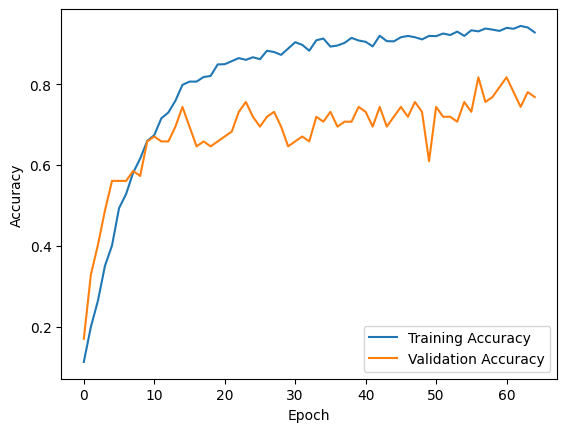

In [ ]:
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

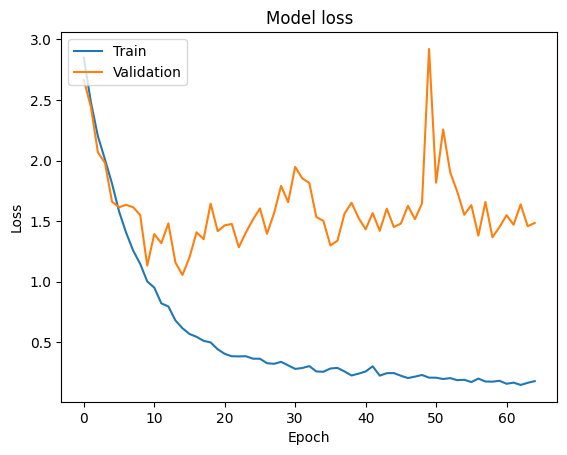

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

3/3 [==============================] - 1s 577ms/step - loss: 1.3835 - accuracy: 0.6265
Test Accuracy: 62.65%


As you see the test and val accuracy is not much good (**test: 63%, val: 80%, train: 94%**)

Let's checkout our wrong predictions to see how bad our model is predicting (can it predict the equal genders?)

3/3 [==============================] - 0s 49ms/step


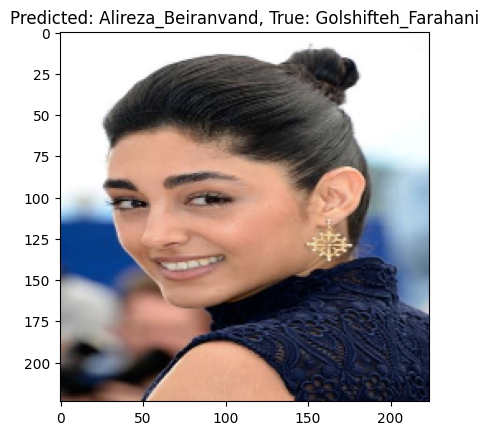

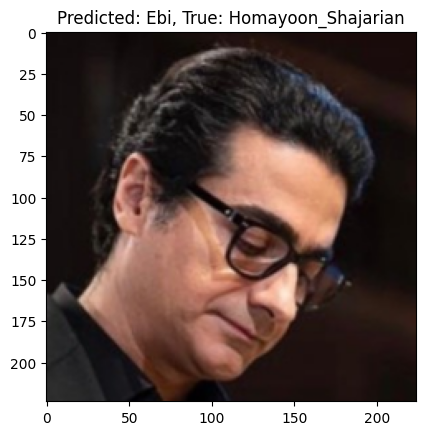

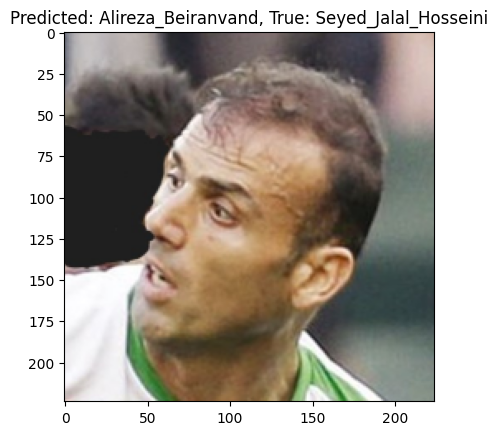

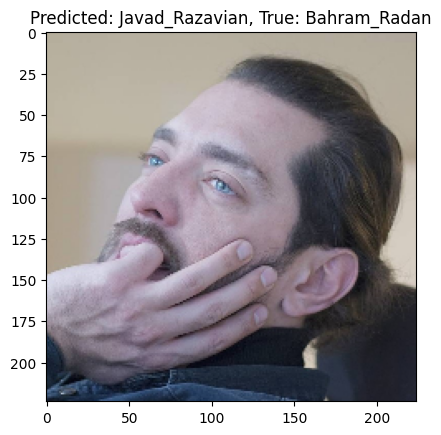

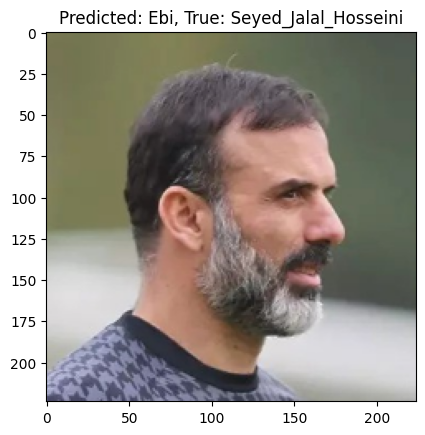

...

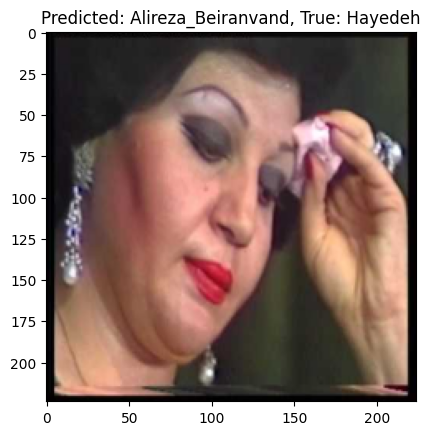

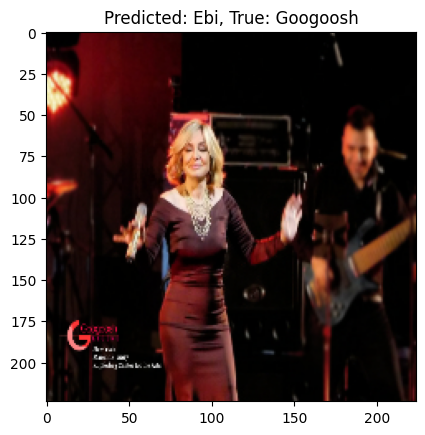

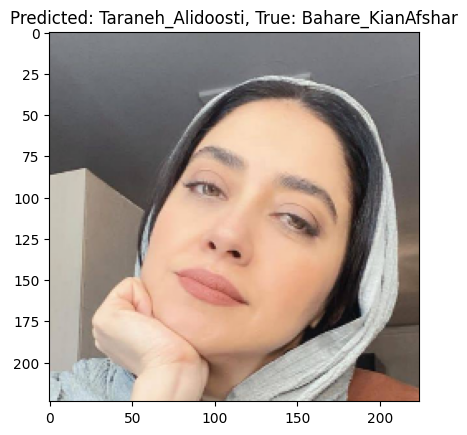

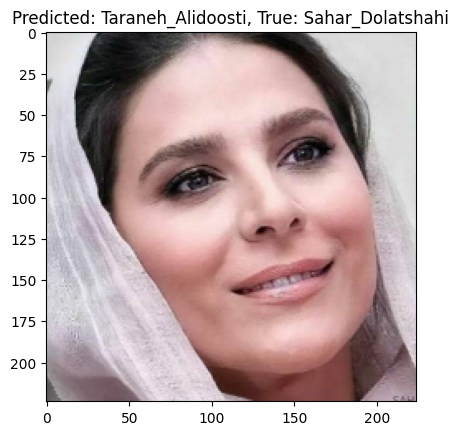

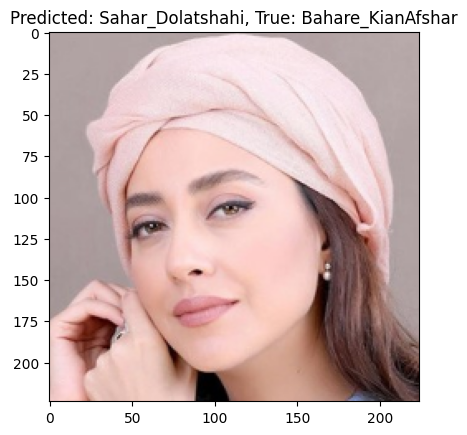

In [ ]:
predictions = model.predict(X_test)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(y_test, axis=1)
incorrect_indices = np.where(predicted_labels != true_labels)[0]
for idx in incorrect_indices[:]:
    denormalized_image = X_test[idx] * 255.0
    plt.imshow(denormalized_image.astype(np.uint8))
    plt.title(f'Predicted: {label_to_celebrity[predicted_labels[idx]]}, True: {label_to_celebrity[true_labels[idx]]}')
    plt.show()

Nope! our model is too weak! Let's check other ways

# **Model 2: Ensemble models (Strong)**

**Multiple models** were evaluated for this project, yet the scarcity of data, with an average of only **55** images per class for training, posed a significant challenge. Moreover, the absence of robust computational resources such as **GPU and RAM** exacerbated the difficulty of the task. Consequently, besides leveraging **transfer learning** techniques, **innovative** approaches were required to design an effective model under resource constraints.

## **Ensemble Model Configuration and Development**

### **Define and Configure Base Models**


In this cell, we define the foundational elements of our ensemble model by initializing three popular convolutional neural networks: ResNet50, InceptionV3, and MobileNetV2. These networks are loaded with weights pre-trained on the ImageNet dataset, which provides a rich set of features learned from a vast variety of images. For our task:

- **ResNet50** is known for its depth and residual connections, allowing it to learn rich feature hierarchies.
- **InceptionV3** applies filters of different sizes at each stage of the network, capturing information at various scales.
- **MobileNetV2** utilizes depthwise separable convolutions, making it efficient and lightweight, ideal for environments with limited computational resources.

**Layer Freezing**: To retain the learned features and prevent overfitting, we freeze all the layers of these models except for the top few. This ensures that the bulk of the pre-trained networks remains unchanged, while only a small fraction is fine-tuned.

**Fine-Tuning**: We unfreeze the last 10 layers of each model. This allows the networks to adapt more specifically to the nuances of our dataset, tuning the most abstract feature representations to better suit face recognition tasks.

**Input Layer Definition**: We define a common input layer that will feed into each of the base models, ensuring that they all process the same input data.

**Output Processing and Pooling**: Each model's output is passed through a Global Average Pooling layer, which reduces the dimensionality and focuses on the most essential features, preventing overfitting and reducing computational load.

**Merging Outputs**: The outputs of the pooling layers are then concatenated. This step integrates diverse aspects of the features extracted by each base model, forming a comprehensive feature set that captures a wide array of facial characteristics.

**Dense and Dropout Layers**: After merging the features from the base models, we add dense layers to interpret these features and provide the capability to learn non-linear combinations of them. The dense layers are designed with 128 and 64 neurons, respectively, and include ReLU activation to introduce non-linearity. A dropout layer with a rate of 0.5 follows the dense layers, which helps in reducing overfitting by randomly omitting a subset of features during training.
  
**Output Layer**: The final layer is a softmax layer with a number of neurons equal to the number of classes (celebrities) we wish to recognize. This layer outputs a probability distribution over the classes, predicting which celebrity a given face most likely represents.


In [ ]:
# Define base models
base_model_resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(target_width, target_height, 3))
base_model_inception = InceptionV3(weights='imagenet', include_top=False, input_shape=(target_width, target_height, 3))
base_model_mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_shape=(target_width, target_height, 3))

# Freeze layers of base models
for model in (base_model_resnet, base_model_inception, base_model_mobilenet):
    for layer in model.layers:
        layer.trainable = False

# Unfreeze top layers of base models
for model in (base_model_resnet, base_model_inception, base_model_mobilenet):
    for layer in model.layers[:-10]:  # Unfreeze all layers except the last 10
        layer.trainable = True

# Define input layer
input_layer = Input(shape=(target_width, target_height, 3))

# Obtain outputs of base models
output_resnet = base_model_resnet(input_layer)
output_inception = base_model_inception(input_layer)
output_mobilenet = base_model_mobilenet(input_layer)

# Apply global average pooling to base model outputs
output_resnet_pooled = GlobalAveragePooling2D()(output_resnet)
output_inception_pooled = GlobalAveragePooling2D()(output_inception)
output_mobilenet_pooled = GlobalAveragePooling2D()(output_mobilenet)

# Concatenate pooled outputs
merged_output = Concatenate()([output_resnet_pooled, output_inception_pooled, output_mobilenet_pooled])

# Add additional layers for classification
x = Dense(128, activation='relu')(merged_output)

x = Dense(64, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax')(x)

# Create model
ensemble_model = Model(inputs=input_layer, outputs=predictions)

9406464/9406464 [==============================] - 0s 0us/step


### **Model Compilation**

The ensemble model is compiled with the Adam optimizer, which is an extension to stochastic gradient descent that has been empirically shown to handle sparse gradients on noisy problems. We use a learning rate of 0.0001 to ensure smooth convergence. The loss function used is categorical crossentropy, suitable for multi-class classification tasks, and accuracy is tracked as the performance metric.

In [ ]:
ensemble_model.summary()

ensemble_model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])



Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 resnet50 (Functional)       (None, 7, 7, 2048)           2358771   ['input_4[0][0]']             
                                                          2                                       
                                                                                                  
 inception_v3 (Functional)   (None, 5, 5, 2048)           2180278   ['input_4[0][0]']             
                                                          4                                       
                                                                                              

### **Callbacks Configuration and Model Training**

EarlyStopping monitors the validation accuracy and halts training after 75 epochs without improvement, ensuring efficient use of resources by preventing overfitting. The ModelCheckpoint saves the model at its best performance state based on the highest validation accuracy. These callbacks are added to the training process to enhance model performance and save computational resources. The model is trained using the training set with specified epochs and batch size, and validation is performed using a separate validation set.

In [ ]:
early_stopping = EarlyStopping(monitor='val_accuracy', patience=75, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('/content/drive/MyDrive/AI/ML-Fall2023/project/github/models/ensemblev9',
                             monitor='val_accuracy',
                             save_best_only=True,
                             mode='max',
                             verbose=1)
callbacks = [early_stopping, model_checkpoint]

In [ ]:
history = ensemble_model.fit(X_train, y_train,
                    epochs=225,
                    batch_size=32,
                    validation_data=(X_val, y_val),
                    callbacks=callbacks)

ensemble_model.save_weights('/content/drive/MyDrive/AI/ML-Fall2023/project/github/models/ensemblev9_final')

Epoch 1/225
61/61 [==============================] - ETA: 0s - loss: 2.5469 - accuracy: 0.1973
Epoch 1: val_accuracy improved from -inf to 0.31765, saving model to /content/drive/MyDrive/AI/ML-Fall2023/project/github/models/ensemblev9
61/61 [==============================] - 263s 2s/step - loss: 2.5469 - accuracy: 0.1973 - val_loss: 2.4093 - val_accuracy: 0.3176
Epoch 2/225
61/61 [==============================] - ETA: 0s - loss: 1.4469 - accuracy: 0.5530
Epoch 2: val_accuracy improved from 0.31765 to 0.56471, saving model to /content/drive/MyDrive/AI/ML-Fall2023/project/github/models/ensemblev9
61/61 [==============================] - 126s 2s/step - loss: 1.4469 - accuracy: 0.5530 - val_loss: 1.6808 - val_accuracy: 0.5647
Epoch 3/225
61/61 [==============================] - ETA: 0s - loss: 0.7526 - accuracy: 0.7653
Epoch 3: val_accuracy improved from 0.56471 to 0.62353, saving model to /content/drive/MyDrive/AI/ML-Fall2023/project/github/models/ensemblev9
61/61 [======================

Due to limited GPU resources, training was prematurely stopped at epoch 125 of 256, and it records the best performance up to that point.

### **Model Performance Plotting and Evaluation**

In [ ]:
import pickle

# Save the history variable
with open('/content/drive/MyDrive/AI/ML-Fall2023/project/github/models/ensemblev9_final_history.pkl', 'wb') as file:
    pickle.dump(history.history, file)


In [ ]:
with open('/content/drive/MyDrive/AI/ML-Fall2023/project/github/models/ensemblev9_final_history.pkl', 'rb') as file:
    history1 = pickle.load(file)


we plot two graphs: one for **accuracy** and the other for **loss**.
The training and validation accuracies and losses per epoch are displayed, providing insights into the model's learning and its generalization over unseen data. The performance plots help in identifying overfitting or underfitting by comparing training and validation metrics.

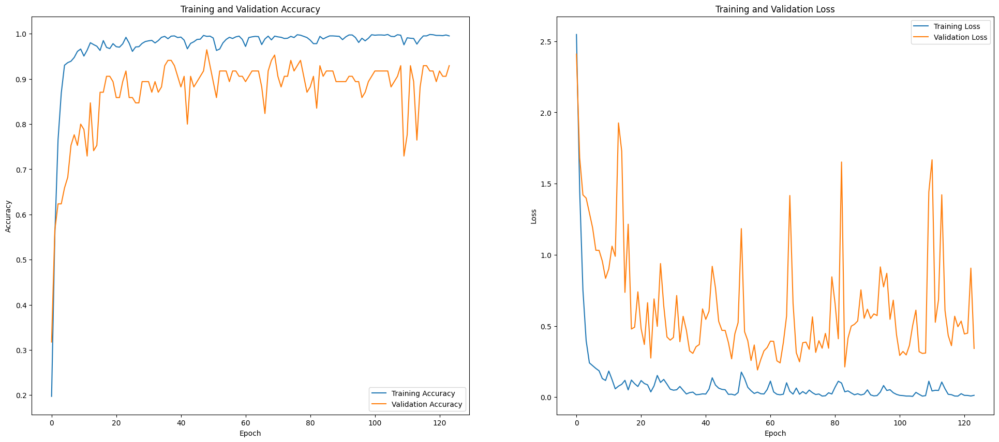

In [ ]:
plt.figure(figsize=(24, 10))

# Plot Training Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

# Plot Training Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

because of the lack of resources (limited GPU!) our training stopped at epoch **125**/256 (even 256 was not much high epochs and higher epochs were needed (1000)) and we have saved version of our  best model till that time
 at epoch 30.

### **Model Loading and Performance Testing on unseen data**

In [ ]:
checkpoint_path  = "models/ensemblev9"

In [ ]:
ensemble_model.load_weights(checkpoint_path)

In [ ]:
train_loss, train_accuracy = ensemble_model.evaluate(X_train, y_train)
print(f'train Accuracy: {train_accuracy * 100:.2f}%')

61/61 [==============================] - 12s 194ms/step - loss: 1.6589e-04 - accuracy: 1.0000
train Accuracy: 100.00%


In [ ]:
val_loss, val_accuracy = ensemble_model.evaluate(X_val, y_val)
print(f'val Accuracy: {val_accuracy * 100:.2f}%')

3/3 [==============================] - 1s 159ms/step - loss: 0.2696 - accuracy: 0.9647
val Accuracy: 96.47%


In [ ]:
test_loss, test_accuracy = ensemble_model.evaluate(X_test, y_test)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

3/3 [==============================] - 6s 3s/step - loss: 0.4822 - accuracy: 0.9070
Test Accuracy: 90.70%


it seems pretty nice! 🔥

let's checkout our worng predictions

In [ ]:
predictions = ensemble_model.predict(X_train)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(y_train, axis=1)
incorrect_indices = np.where(predicted_labels != true_labels)[0]
for idx in incorrect_indices[:]:
    denormalized_image = X_train[idx] * 255.0
    plt.imshow(denormalized_image.astype(np.uint8))
    plt.title(f'Predicted: {label_to_celebrity[predicted_labels[idx]]}, True: {label_to_celebrity[true_labels[idx]]}')
    plt.show()

3/3 [==============================] - 0s 206ms/step


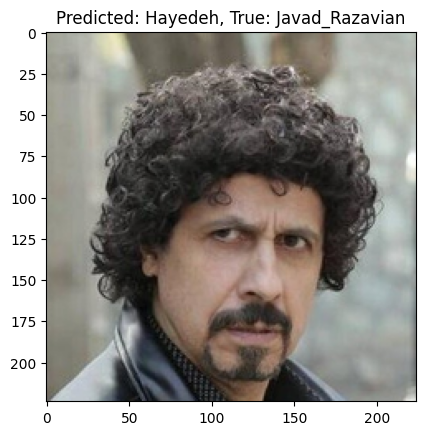

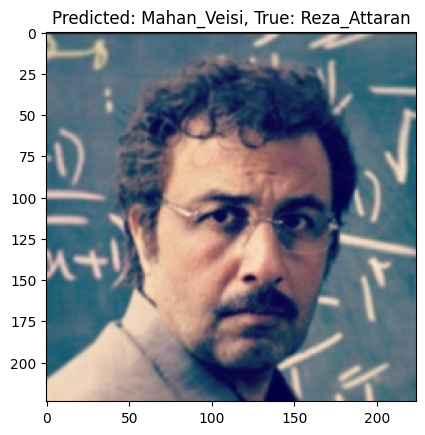

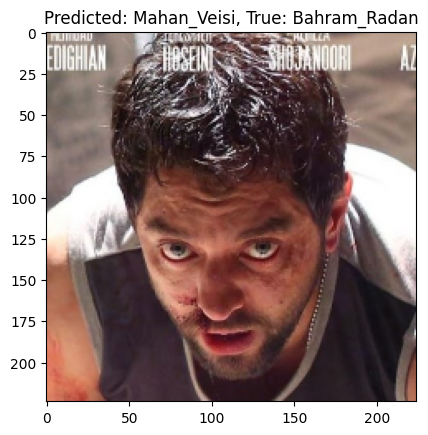

In [ ]:
predictions = ensemble_model.predict(X_val)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(y_val, axis=1)
incorrect_indices = np.where(predicted_labels != true_labels)[0]
for idx in incorrect_indices[:]:
    denormalized_image = X_val[idx] * 255.0
    plt.imshow(denormalized_image.astype(np.uint8))
    plt.title(f'Predicted: {label_to_celebrity[predicted_labels[idx]]}, True: {label_to_celebrity[true_labels[idx]]}')
    plt.show()

As observed from the incorrectly predicted unseen images, even the false predictions share some similarities with the actual person, such as gender, skin tone, or hair type. These misclassifications highlight the potential for improvement with a larger dataset, as the current average of 55 images per class is insufficient. Additionally, better computational resources, including more RAM and extended GPU usage, could enhance model performance.

### **test on real images in drive**

In [ ]:
cd github

/content/drive/MyDrive/AI/ML-Fall2023/project/github


In [ ]:
ls

augmented_dataset_final1/  augmented_dataset_final2/  dataset/  extra/  models/  test/


In [ ]:
model_path = 'models/ensemblev9'  # Adjust the path accordingly
model = load_model(model_path)

In [ ]:
def display_image(img_path):
    img = image.load_img(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.show()

Original Image:


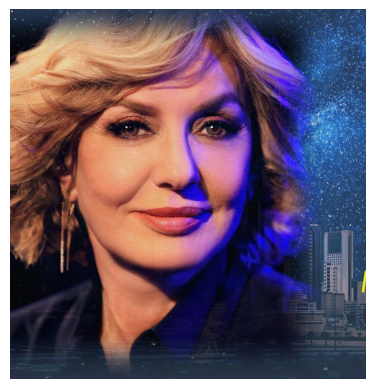

In [ ]:
image_path = 'test/Copy of 18209233_740059809501542_7500910183230757392_o.jpg'  # Replace with the path to your image
# Display the original image
print("Original Image:")
display_image(image_path)

In [ ]:
# Function to preprocess the image
def preprocess_image(img_path, target_size=(224, 224)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # Normalize pixel values between 0 and 1
    return img_array# Preprocess the image
preprocessed_img = preprocess_image(image_path)

In [ ]:
# Make predictions
predictions = ensemble_model.predict(preprocessed_img)

1/1 [==============================] - 2s 2s/step


In [ ]:
predictions

array([[8.2418190e-14, 2.3915030e-14, 6.3825632e-21, 4.8387776e-11,
        1.7068284e-16, 9.9563709e-14, 2.4716059e-17, 1.5887126e-13,
        1.4038549e-15, 1.5331117e-15, 6.9925554e-17, 1.6142397e-20,
        5.2144963e-17, 7.5482812e-16, 2.8694187e-19, 1.0000000e+00,
        3.5087622e-17, 1.4823235e-17]], dtype=float32)

In [ ]:
# Get the predicted class label
predicted_class_index = np.argmax(predictions)

In [ ]:
predicted_class_index

15

In [ ]:
predicted_class_label = label_to_celebrity[predicted_class_index]

print("Predicted Class:", predicted_class_label)

Predicted Class: Googoosh
